## Giới thiệu

Thời gian gần đây, nhiều doanh nghiệp đang chuyển sang hoạt động trực tuyến, và người tiêu dùng cũng đang đặt hàng trực tuyến thay vì đi đến cửa hàng để mua sắm. Zomato và Swiggy là những nền tảng trực tuyến phổ biến để đặt món ăn. Các ví dụ khác bao gồm Uber Eats, Food Panda và Deliveroo, cũng cung cấp dịch vụ tương tự. Họ cung cấp các tùy chọn giao hàng đồ ăn. Nếu đơn hàng hoàn tất, đối tác sẽ đến lấy và giao đồ ăn đến địa chỉ đã cung cấp thông qua dịch vụ giao hàng. Đối với ứng dụng đặt đồ ăn trực tuyến, thời gian giao hàng rất quan trọng. Do đó, dự đoán thời gian giao hàng ước tính để đạt được vị trí của người mua là rất quan trọng. Mạng nơ-ron LSTM là một trong những phương pháp có thể được áp dụng trong trường hợp này. Hãy cùng tìm hiểu về các mô hình LSTM chi tiết hơn.

## Mục tiêu của Dự đoán Thời gian Giao Đồ Ăn

1. Đưa ra ước tính chính xác về thời điểm đồ ăn sẽ được giao, từ đó tăng lòng tin của khách hàng.
2. Lên kế hoạch tuyến đường giao hàng và lịch làm việc của tài xế hiệu quả hơn bằng cách dự đoán số lượng đơn hàng sẽ đến, giúp nhà cung cấp giao hàng sử dụng nguồn lực tốt hơn.
3. Giao hàng nhanh hơn bằng cách xem xét dữ liệu giao hàng trong quá khứ và xác định các thuộc tính ảnh hưởng đến chúng.
4. Phát triển kinh doanh nhờ sự hài lòng của người mua với tốc độ giao hàng.

Dựa trên những mục tiêu này, chúng ta sẽ sử dụng Mạng Nơ-ron LSTM để phát triển một mô hình có thể ước tính thời gian giao hàng của các đơn hàng một cách chính xác dựa trên tuổi của đối tác giao hàng, xếp hạng của đối tác và khoảng cách giữa nhà hàng và nơi của người mua. Bài viết này sẽ hướng dẫn bạn dự đoán thời gian giao hàng đồ ăn sử dụng LSTM. Bây giờ, hãy tiến hành dự đoán thông qua các bước trong bài viết.

## Bước 1: Nhập các thư viện cần thiết

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, LSTM

Thư viện Pandas và NumPy được sử dụng cùng nhau cho phân tích dữ liệu. NumPy cung cấp các hàm toán học nhanh chóng cho các mảng đa chiều, trong khi Pandas giúp việc phân tích và thao tác dữ liệu dễ dàng hơn với các cấu trúc dữ liệu phức tạp hơn như DataFrame và Series. Trong khi đó, thư viện Plotly Express giúp người dùng dễ dàng tạo ra các biểu đồ tương tác trong Python. Nó có thể sử dụng mã lệnh tối giản để tạo ra nhiều loại biểu đồ, chẳng hạn như biểu đồ phân tán, biểu đồ đường, biểu đồ cột và bản đồ. Lớp Sequential là một loại mô hình trong Keras cho phép người dùng tạo ra mạng nơ-ron bằng cách thêm các lớp vào mô hình theo thứ tự tuần tự. Sau đó, Dense và LSTM được sử dụng để tạo các lớp trong mô hình Keras cũng như tùy chỉnh cấu hình của chúng.

## Bước 2: Đọc dữ liệu

Việc có sẵn dữ liệu rất quan trọng đối với bất kỳ công việc phân tích dữ liệu nào. Điều cần thiết là phải có một tập dữ liệu chứa tất cả các đặc trưng và biến cần thiết cho công việc cụ thể đang được thực hiện. Và trong trường hợp cụ thể này, tập dữ liệu phù hợp nằm trên github của tôi. Tập dữ liệu được cung cấp ở đây là phiên bản đã được làm sạch của tập dữ liệu gốc được Gaurav Malik đăng tải trên Kaggle: https://www.kaggle.com/datasets/gauravmalik26/food-delivery-dataset?select=train.csv

In [2]:
url = 'https://raw.githubusercontent.com/ataislucky/Data-Science/main/dataset/food_delivery.txt'
data = pd.read_csv(url)
data.sample(5)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min)
2143,696E,INDORES16DEL03,32,4.4,22.744648,75.894377,22.804648,75.954377,Meal,motorcycle,38
17197,7A77,CHENRES14DEL01,33,4.2,13.026279,80.174568,13.136279,80.284568,Snack,motorcycle,39
44535,BAF8,PUNERES12DEL03,25,4.9,18.520016,73.830547,18.550016,73.860547,Snack,motorcycle,21
22355,2456,BANGRES04DEL01,36,4.3,12.980410,77.640489,13.020410,77.680489,Snack,motorcycle,34
33338,6.6E+09,PUNERES08DEL03,31,4.9,18.534080,73.898520,18.564080,73.928520,Buffet,scooter,25


Hãy xem thông tin chi tiết về tập dữ liệu mà chúng ta sử dụng bằng lệnh info().

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  int64  
 3   Delivery_person_Ratings      45593 non-null  float64
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Type_of_order                45593 non-null  object 
 9   Type_of_vehicle              45593 non-null  object 
 10  Time_taken(min)              45593 non-null  int64  
dtypes: float64(5), int64(2), object(4)
memory usage: 3.8+ MB


Kiểm tra các cột và giá trị null của tập dữ liệu là điều cần thiết trong bất kỳ dự án phân tích dữ liệu nào. Hãy thực hiện điều đó.

In [4]:
data.isnull().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Type_of_order                  0
Type_of_vehicle                0
Time_taken(min)                0
dtype: int64

Tập dữ liệu hoàn chỉnh không có giá trị null, vậy hãy tiếp tục!

## Bước 3: Công thức Haversine

Công thức Haversine được sử dụng để tìm khoảng cách giữa hai địa điểm địa lý. Công thức được tham khảo từ trang Wikipedia như sau:

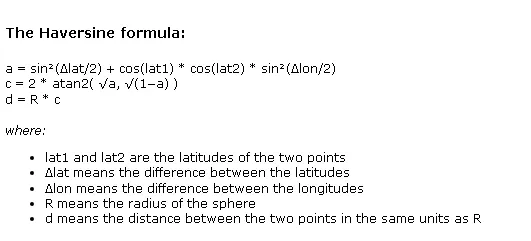

Công thức này lấy vĩ độ và kinh độ của hai điểm, chuyển đổi các góc sang radian để thực hiện các phép tính cần thiết. Chúng ta sử dụng công thức này bởi vì tập dữ liệu không cung cấp khoảng cách giữa nhà hàng và địa điểm giao hàng. Chỉ có vĩ độ và kinh độ. Vậy, hãy tính toán khoảng cách và sau đó tạo một cột khoảng cách trong tập dữ liệu.

In [6]:
R = 6371  ##The earth's radius (in kilometers)

def deg_to_rad(degrees):
    return degrees * (np.pi/180)

## The haversine formula
def distcalculate(lat1, lon1, lat2, lon2):
    d_lat = deg_to_rad(lat2-lat1)
    d_lon = deg_to_rad(lon2-lon1)
    a1 = np.sin(d_lat/2)**2 + np.cos(deg_to_rad(lat1))
    a2 = np.cos(deg_to_rad(lat2)) * np.sin(d_lon/2)**2
    a = a1 * a2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    return R * c

Tham số "lat" có nghĩa là vĩ độ, và "lon" có nghĩa là kinh độ. Hàm deg_to_rad hữu ích để chuyển đổi độ sang radian. Đồng thời, tính khoảng cách giữa hai điểm địa lý sử dụng các biến a1 và a2. Biến lưu trữ kết quả của việc nhân a1 và a2, trong khi biến c lưu trữ kết quả của việc tính toán công thức Haversine, từ đó tìm ra khoảng cách giữa hai điểm địa lý.

In [7]:
# Create distance column & calculate the distance between each pair of points
data['distance'] = np.nan

for i in range(len(data)):
  data.loc[i, 'distance'] = distcalculate(data.loc[i, 'Restaurant_latitude'], 
                                          data.loc[i, 'Restaurant_longitude'], 
                                          data.loc[i, 'Delivery_location_latitude'], 
                                          data.loc[i, 'Delivery_location_longitude'])

In [8]:
data["distance"].head()

0     2.050806
1    14.086096
2     1.083801
3     5.457067
4     4.333926
Name: distance, dtype: float64

Chúng ta đã thêm một cột khoảng cách vào tập dữ liệu. Bây giờ, chúng ta sẽ phân tích tác động của khoảng cách và thời gian giao hàng.

In [9]:
figure = px.scatter(data_frame = data,
                    x="distance",
                    y="Time_taken(min)", 
                    size="Time_taken(min)", 
                    trendline="ols", 
                    title = "Relationship Between Time Taken and Distance")
figure.show()

Biểu đồ cho thấy có mối quan hệ nhất quán giữa thời gian giao hàng và khoảng cách di chuyển trong việc giao đồ ăn. Điều này có nghĩa là đa số các đối tác giao hàng đưa đồ ăn đến trong khoảng thời gian 25-30 phút, bất kể khoảng cách.

Tiếp theo, chúng ta sẽ khám phá xem tuổi của đối tác giao hàng có ảnh hưởng đến thời gian giao hàng hay không.

In [10]:
figure = px.scatter(data_frame = data, 
                    x="Delivery_person_Age",
                    y="Time_taken(min)", 
                    size="Time_taken(min)", 
                    color = "distance",
                    trendline="ols", 
                    title = "Relationship Between Delivery Partner Age and Time Taken")
figure.show()

Biểu đồ cho thấy việc giao đồ ăn nhanh hơn khi đối tác giao hàng trẻ hơn so với những người lớn tuổi hơn. Bây giờ hãy khám phá mối tương quan giữa thời gian giao hàng và đánh giá của đối tác giao hàng.

In [11]:
figure = px.scatter(data_frame = data, 
                    x="Delivery_person_Ratings",
                    y="Time_taken(min)", 
                    size="Time_taken(min)", 
                    color = "distance",
                    trendline="ols", 
                    title = "Relationship Between Delivery Partner Ratings and Time Taken")
figure.show()

Biểu đồ cho thấy mối quan hệ tuyến tính nghịch. Đối tác có đánh giá cao hơn thì thời gian cần thiết để giao đồ ăn càng nhanh, và ngược lại.

Bước tiếp theo sẽ là xem liệu phương tiện của đối tác giao hàng có ảnh hưởng đến thời gian giao hàng hay không.

In [12]:
fig = px.box(data, 
             x="Type_of_vehicle",
             y="Time_taken(min)", 
             color="Type_of_order",
             title = "Relationship Between Type of Vehicle and Type of Order")
fig.show()

Biểu đồ cho thấy loại phương tiện của đối tác giao hàng và loại đồ ăn được giao không ảnh hưởng đáng kể đến thời gian giao hàng.

Thông qua việc phân tích ở trên, chúng ta có thể xác định rằng tuổi của đối tác giao hàng, đánh giá của đối tác giao hàng và khoảng cách giữa nhà hàng và địa điểm giao hàng là những đặc trưng có ảnh hưởng đáng kể nhất đến thời gian giao đồ ăn.

## Bước 4: Xây dựng mô hình LSTM và đưa ra dự đoán

Trước đây, chúng ta đã xác định ba đặc trưng ảnh hưởng đáng kể đến thời gian giao hàng, đó là tuổi của đối tác giao hàng, đánh giá của đối tác giao hàng và khoảng cách. Vì vậy, ba đặc trưng này sẽ trở thành các biến độc lập (x), trong khi thời gian giao hàng sẽ trở thành biến phụ thuộc (y).

In [14]:
x = np.array(data[["Delivery_person_Age", 
                   "Delivery_person_Ratings", 
                   "distance"]])
y = np.array(data[["Time_taken(min)"]])
xtrain, xtest, ytrain, ytest = train_test_split(x, y, 
                                                test_size=0.20, 
                                                random_state=33)

Bây giờ, chúng ta cần huấn luyện một mạng nơ-ron LSTM để dự đoán thời gian giao đồ ăn. Mục tiêu là tạo ra một mô hình chính xác sử dụng các đặc trưng như khoảng cách, tuổi của đối tác giao hàng và đánh giá để ước tính thời gian giao đồ ăn. Sau đó, mô hình được huấn luyện có thể được sử dụng để dự đoán các điểm dữ liệu mới hoặc các tình huống chưa từng gặp.

In [15]:
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (xtrain.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 3, 128)            66560     
                                                                 
 lstm_1 (LSTM)               (None, 64)                49408     
                                                                 
 dense (Dense)               (None, 25)                1625      
                                                                 
 dense_1 (Dense)             (None, 1)                 26        
                                                                 
Total params: 117,619
Trainable params: 117,619
Non-trainable params: 0
_________________________________________________________________


Đoạn mã ở trên giải thích:

Dòng đầu tiên bắt đầu xây dựng kiến trúc mô hình bằng cách tạo một thực thể của lớp Sequential. Ba dòng tiếp theo xác định các lớp của mô hình. Lớp đầu tiên là một lớp LSTM với 128 đơn vị, trả về chuỗi và nhận đầu vào có hình dạng (xtrain.shape[1], 1). Ở đây, xtrain là dữ liệu huấn luyện đầu vào, và shape[1] đại diện cho số lượng đặc trưng trong dữ liệu đầu vào. Tham số return_sequences được đặt thành True vì sẽ có nhiều lớp sau lớp này. Lớp thứ hai cũng là một lớp LSTM, nhưng với 64 đơn vị và return_sequences được đặt thành False, chỉ ra rằng đây là lớp cuối cùng. Dòng thứ ba thêm một lớp dày đặc với 25 đơn vị, giảm kích thước đầu ra của các lớp LSTM xuống một kích thước dễ quản lý hơn. Cuối cùng, dòng thứ tư thêm một lớp dày đặc với một đơn vị, đó là lớp đầu ra của mô hình.

Bây giờ, chúng ta sẽ huấn luyện mô hình đã tạo trước đó.

In [16]:
# training the model
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(xtrain, ytrain, batch_size=1, epochs=9)

Epoch 1/9
36474/36474 [==============================] - 198s 5ms/step - loss: 69.3775
Epoch 2/9
36474/36474 [==============================] - 213s 6ms/step - loss: 64.0272
Epoch 3/9
36474/36474 [==============================] - 259s 7ms/step - loss: 61.5446
Epoch 4/9
36474/36474 [==============================] - 298s 8ms/step - loss: 60.8012
Epoch 5/9
36474/36474 [==============================] - 250s 7ms/step - loss: 59.8806
Epoch 6/9
36474/36474 [==============================] - 225s 6ms/step - loss: 59.5860
Epoch 7/9
36474/36474 [==============================] - 189s 5ms/step - loss: 59.3776
Epoch 8/9
36474/36474 [==============================] - 186s 5ms/step - loss: 58.8842
Epoch 9/9
36474/36474 [==============================] - 237s 7ms/step - loss: 59.4024


Tham số 'adam' là một thuật toán tối ưu hóa phổ biến cho các mô hình học sâu, và tham số 'mean_squared_error' là một hàm mất mát thông dụng được sử dụng trong các vấn đề hồi quy. Tham số batch_size = 1 có nghĩa là mô hình sẽ cập nhật trọng số của nó sau khi mỗi mẫu được xử lý trong quá trình huấn luyện. Tham số epochs được đặt thành 9, có nghĩa là mô hình sẽ được huấn luyện trên toàn bộ tập dữ liệu trong chín lần lặp.

Cuối cùng, hãy kiểm tra hiệu năng của mô hình trong việc dự đoán thời gian giao đồ ăn dựa trên ba thông số đầu vào (tuổi của đối tác giao hàng, đánh giá giao hàng và khoảng cách).

In [22]:
print("Food Delivery Time Prediction using LSTM")
a = int(input("Delivery Partner Age: "))
b = float(input("Previous Delivery Ratings: "))
c = int(input("Total Distance: "))

features = np.array([[a, b, c]])
print("Delivery Time Prediction in Minutes = ", model.predict(features))

Food Delivery Time Prediction using LSTM
1/1 [==============================] - 0s 26ms/step
Delivery Time Prediction in Minutes =  [[35.857113]]


Kết quả đã cho là dự đoán thời gian giao hàng cho một đơn hàng giao đồ ăn giả định dựa trên mô hình mạng nơ-ron LSTM đã được huấn luyện, sử dụng các đặc trưng đầu vào sau:

Tuổi của đối tác giao hàng: 33
Đánh giá giao hàng trước đó: 4.0
Tổng khoảng cách: 7
Kết quả của dự đoán được hiển thị là "Dự đoán thời gian giao hàng trong phút = [[36.913715]]," có nghĩa là mô hình đã ước tính rằng việc giao đồ ăn sẽ mất khoảng 36,91 phút để đến điểm đến.

## Kết luận

Bài viết này bắt đầu bằng việc tính toán khoảng cách giữa nhà hàng và địa điểm giao hàng. Sau đó, nó phân tích thời gian giao hàng trước đó cho cùng một khoảng cách trước khi dự đoán thời gian giao đồ ăn trong thời gian thực bằng cách sử dụng LSTM. Nói chung, trong bài viết này, chúng tôi đã thảo luận về các vấn đề sau:

Làm thế nào để tính khoảng cách bằng công thức haversine?
Làm thế nào để tìm ra các đặc trưng ảnh hưởng đến việc dự đoán thời gian giao hàng đồ ăn?
Làm thế nào để sử dụng mô hình mạng nơ-ron LSTM để dự đoán thời gian giao đồ ăn?
Nhìn chung, bài viết cung cấp hướng dẫn toàn diện về dự đoán thời gian giao đồ ăn với mạng nơ-ron LSTM bằng Python. Nếu bạn có bất kỳ câu hỏi hoặc ý kiến, vui lòng để lại phía dưới. Mã nguồn hoàn chỉnh có thể xem tại đây.